# Settings

In [1]:
import numpy as np
import sys
import pandas as pd
import itertools

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from statsmodels.tsa.stattools import grangercausalitytests

import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.preprocessing import MinMaxScaler

import tigramite
import tigramite.data_processing as pp
import tigramite.plotting as tp
from tigramite.plotting import plot_time_series_graph

from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr
from tigramite.independence_tests.robust_parcorr import RobustParCorr

from tigramite.models import LinearMediation, Models
from tigramite.causal_effects import CausalEffects

import os

import pkg_resources

import cdsapi
import random
import zipfile

import netCDF4 as nc
import xarray as xr

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import nbformat

import seaborn as sns

from arch.unitroot import PhillipsPerron
from scipy import stats
from scipy.stats import gaussian_kde

import networkx as nx

from scipy.stats import pearsonr

import dagviz
from collections import Counter

/Users/juliette/anaconda3/envs/envEmma/lib/python3.9/site-packages/threadpoolctl.py:1223: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


# Basemodel

In [2]:
start_year = 1950
length = 12*(2022 - start_year)

## WPAC = Sea level pressure (in Pa) in the West Pacific

In [3]:
WPAC = np.loadtxt('iera5_slp_130-150E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [4]:
mean_WPAC = np.mean(WPAC)
std_dev_WPAC = np.std(WPAC)
median_WPAC = np.median(WPAC)
min_val_WPAC = np.min(WPAC)
max_val_WPAC = np.max(WPAC)

print("Mean:", mean_WPAC)
print("Standard Deviation:", std_dev_WPAC)
print("Median:", median_WPAC)
print("Minimum Value:", min_val_WPAC)
print("Maximum Value:", max_val_WPAC)

Mean: 100934.85266203702
Standard Deviation: 93.61832329131148
Median: 100938.0
Minimum Value: 100659.9
Maximum Value: 101247.5


In [5]:
start_year = 1950
end_year = 2022
plot_length = 12 * (end_year - start_year + 1)
time_index = pd.date_range(start=f'{start_year}-01', periods=plot_length, freq='MS')
time_index = time_index[:len(WPAC)]

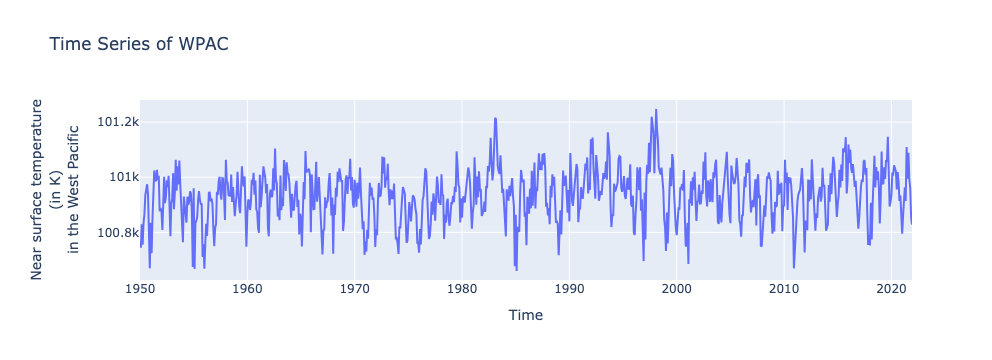

In [6]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=WPAC, mode='lines', name='WPAC'))
fig.update_layout(
    title='Time Series of WPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the West Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## CPAC = Near surface temperature (in K) in the Central Pacific

In [7]:
CPAC = np.loadtxt('iera5_t2m_-150--130E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [8]:
mean_CPAC = np.mean(CPAC)
std_dev_CPAC = np.std(CPAC)
median_CPAC = np.median(CPAC)
min_val_CPAC = np.min(CPAC)
max_val_CPAC = np.max(CPAC)

print("Mean:", mean_CPAC)
print("Standard Deviation:", std_dev_CPAC)
print("Median:", median_CPAC)
print("Minimum Value:", min_val_CPAC)
print("Maximum Value:", max_val_CPAC)

Mean: 298.8509971064815
Standard Deviation: 0.8447594851404049
Median: 298.91795
Minimum Value: 296.1973
Maximum Value: 300.8865


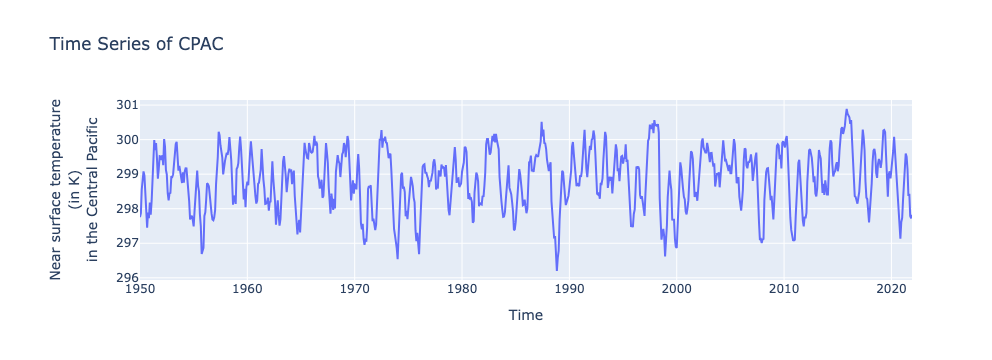

In [9]:
time_index = time_index[:len(CPAC)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=CPAC, mode='lines', name='CPAC'))
fig.update_layout(
    title='Time Series of CPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the Central Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## EPAC = Near surface temperature (in K) in the East Pacific

In [10]:
EPAC = np.loadtxt('iera5_t2m_-100--80E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]

In [11]:
mean_EPAC = np.mean(EPAC)
std_dev_EPAC = np.std(EPAC)
median_EPAC = np.median(EPAC)
min_val_EPAC = np.min(EPAC)
max_val_EPAC = np.max(EPAC)

print("Mean:", mean_EPAC)
print("Standard Deviation:", std_dev_EPAC)
print("Median:", median_EPAC)
print("Minimum Value:", min_val_EPAC)
print("Maximum Value:", max_val_EPAC)

Mean: 296.9792201388889
Standard Deviation: 1.5031017287062765
Median: 296.94034999999997
Minimum Value: 293.807
Maximum Value: 300.8609


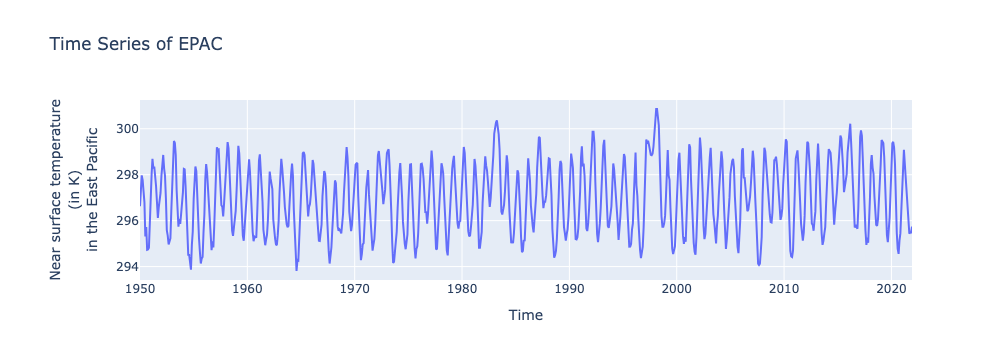

In [12]:
time_index = time_index[:len(EPAC)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=EPAC, mode='lines', name='EPAC'))
fig.update_layout(
    title='Time Series of EPAC',
    xaxis_title='Time',
    yaxis_title='Near surface temperature<br>(in K)<br>in the East Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)
fig.show()

## TW = Near surface winds (in m/s) in the Central Pacific

In [13]:
TW = np.loadtxt('iera5_u10m_-180--130E_-5-5N_n.dat.txt', skiprows=20)[:, 1:].reshape(-1)[:length]
TW *= -1 

In [14]:
mean_TW = np.mean(TW)
std_dev_TW = np.std(TW)
median_TW = np.median(TW)
min_val_TW = np.min(TW)
max_val_TW = np.max(TW)

print("Mean:", mean_TW)
print("Standard Deviation:", std_dev_TW)
print("Median:", median_TW)
print("Minimum Value:", min_val_TW)
print("Maximum Value:", max_val_TW)

Mean: 5.440672281446759
Standard Deviation: 1.0029878863066852
Median: 5.5784445
Minimum Value: -0.3439944
Maximum Value: 7.407164


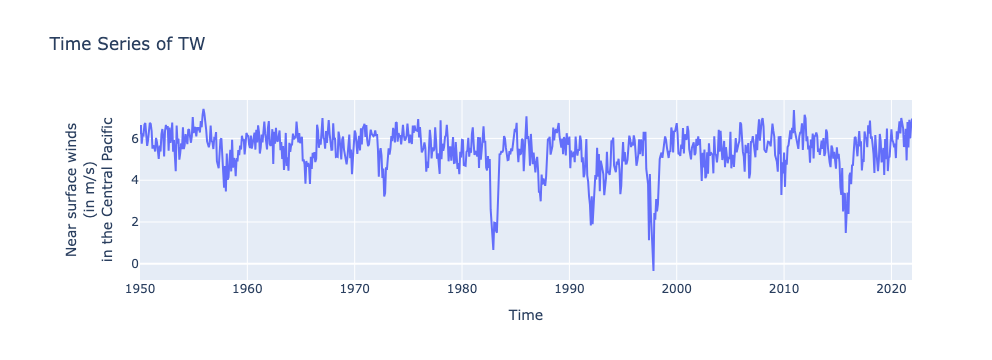

In [15]:
time_index = time_index[:len(TW)]

fig = go.Figure()
fig.add_trace(go.Scatter(x=time_index, y=TW, mode='lines', name='TW'))

fig.update_layout(
    title='Time Series of TW',
    xaxis_title='Time',
    yaxis_title='Near surface winds<br>(in m/s)<br>in the Central Pacific',
    margin=dict(l=140), 
    yaxis=dict(
        title_standoff=10,
        automargin=True
    )
)

fig.show()

## Extended Dataset and lists

In [16]:
extended_data = np.vstack((
    WPAC,
    CPAC,
    EPAC,
    TW
                )).T

In [17]:
var_names = ['WPAC','CPAC','EPAC','TW']

In [18]:
df_extended_data = pd.DataFrame(extended_data, columns=var_names)
print(df_extended_data)

         WPAC      CPAC      EPAC        TW
0    100765.4  297.7563  296.6236  6.193619
1    100744.7  297.8752  297.7186  6.642407
2    100829.8  298.5520  297.9710  5.747903
3    100755.0  298.8250  297.7608  6.185169
4    100833.0  299.0785  297.0467  6.157930
..        ...       ...       ...       ...
859  101088.8  298.3702  295.8983  5.568634
860  100991.4  298.4291  295.4264  6.888685
861  100960.9  297.7851  295.4964  5.994689
862  100855.1  297.7210  295.4913  6.632870
863  100828.4  297.8257  295.7404  6.947123

[864 rows x 4 columns]


We will also store the means and variances of the variables in a list so that we can access it easily, following the order like in the extended_data set.

In [19]:
means = [mean_WPAC, mean_CPAC, mean_EPAC, mean_TW]
variances = [(std_dev_WPAC**2), (std_dev_CPAC**2), (std_dev_EPAC**2), (std_dev_TW**2)]

In [20]:
print(means)
print(variances)

[100934.85266203702, 298.8509971064815, 296.9792201388889, 5.440672281446759]
[8764.390455876513, 0.7136185877346819, 2.2593148068397966, 1.005984700077952]


## Detrending and deseazonalizing

In [21]:
def deTrend_deSeasonalize(data, period=12, show_plot = True):
    # step 1: seasonal component
    decomposition = seasonal_decompose(data, model='additive', period=period) # 1 for annual, 12 for monthly, 52 for weekly and 365 for daily
    data = data - decomposition.seasonal
    # step 2: Trend based on Gaussian kernel smoother
    #smoothed = pp.smooth(np.copy(data), smooth_width=15 * 12, residuals=False)
    index = range(0, len(data))

    if show_plot == True:
        plt.plot(index, data)
        #plt.plot(index,smoothed)
        plt.legend(['data', 'Smoothed trend'])
        plt.title("Deseasonalized data with smoothed trend")
        plt.show()

    else:
        result = data #- smoothed
        return result

In [22]:
#cpac_detrend = deTrend_deSeasonalize(df_extended_data['CPAC'], show_plot = False)
#epac_detrend = deTrend_deSeasonalize(df_extended_data['EPAC'], show_plot = False)
#wpac_detrend = deTrend_deSeasonalize(df_extended_data['WPAC'], show_plot = False)
#tw_detrend = deTrend_deSeasonalize(df_extended_data['TW'], show_plot = False)
        
#df = pd.DataFrame({'WPAC': wpac_detrend, 
#                                        'CPAC': cpac_detrend, 
#                                        'EPAC': epac_detrend,
#                                        'TW': tw_detrend})

# Full History Reanalysis PCMCI Algorithm

In [23]:
def link_robustness_complete_reanalysis(data, parcorr, tau_max=3, tau_min=1, pc_alpha=0.05, alpha_level=0.01, extended = 0, info = True, model = 'model'):
    parcorr = ParCorr(confidence='analytic', mask_type='y')
    if extended == 0:

        # Variable names used throughout
        var_names = ['WPAC', 'CPAC', 'EPAC']
        data = data[:,:3]

        # make data frame of data
        df = pd.DataFrame(data, columns=var_names)
        dfT = pp.DataFrame(data, 
                                 datatime = np.arange(len(data)), 
                                 var_names=var_names)

        cpac_detrend = deTrend_deSeasonalize(df['CPAC'], show_plot = False)
        epac_detrend = deTrend_deSeasonalize(df['EPAC'], show_plot = False)
        wpac_detrend = deTrend_deSeasonalize(df['WPAC'], show_plot = False)

        df_processed = pd.DataFrame({'WPAC': wpac_detrend, 'CPAC': cpac_detrend, 'EPAC': epac_detrend})
    
    elif extended == 1:

        # Variable names used throughout
        var_names = ['WPAC', 'CPAC', 'EPAC', 'TW']
        data = data[:,:4]

        
        # make data frame of data
        df = pd.DataFrame(data, columns=var_names)
        dfT = pp.DataFrame(data, 
                                 datatime = np.arange(len(data)), 
                                 var_names=var_names)

        cpac_detrend = deTrend_deSeasonalize(df['CPAC'], show_plot = False)
        epac_detrend = deTrend_deSeasonalize(df['EPAC'], show_plot = False)
        wpac_detrend = deTrend_deSeasonalize(df['WPAC'], show_plot = False)
        tw_detrend = deTrend_deSeasonalize(df['TW'], show_plot = False)
        
        df_processed = pd.DataFrame({'WPAC': wpac_detrend, 
                                        'CPAC': cpac_detrend, 
                                        'EPAC': epac_detrend,
                                        'TW': tw_detrend})
            
    elif extended == 2:
        # Variable names used throughout
        var_names = ['WPAC', 'CPAC', 'EPAC', 'TW', 'NHF']

        # make data frame of data
        df = pd.DataFrame(data, columns=var_names)
        dfT = pp.DataFrame(data, 
                                 datatime = np.arange(len(data)), 
                                 var_names=var_names)

        cpac_detrend = deTrend_deSeasonalize(df['CPAC'], show_plot = False)
        epac_detrend = deTrend_deSeasonalize(df['EPAC'], show_plot = False)
        wpac_detrend = deTrend_deSeasonalize(df['WPAC'], show_plot = False)
        tw_detrend = deTrend_deSeasonalize(df['TW'], show_plot = False)
        nhf_detrend = deTrend_deSeasonalize(df['NHF'], show_plot = False)
        
        df_processed = pd.DataFrame({'WPAC': wpac_detrend, 
                                        'CPAC': cpac_detrend, 
                                        'EPAC': epac_detrend,
                                        'TW': tw_detrend,
                                        'NHF': nhf_detrend})
            
    # Construct mask for spring barrier
    cycle_length = 12
    springbarrier_mask = np.ones(df_processed.shape, dtype=bool)
    for i in [4, 5, 6, 7, 8, 9, 10, 11, 0]:
        springbarrier_mask[i::cycle_length, :] = False
    dfT_processed = pp.DataFrame(np.copy(df_processed), datatime = {0:np.arange(len(df_processed))}, var_names= var_names, mask = springbarrier_mask)
    pcmci = PCMCI(dataframe=dfT_processed, cond_ind_test=parcorr,verbosity=0)
    results = pcmci.run_pcmci(tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, fdr_method = 'fdr_bh')
    
    # Plot the graph
    tp.plot_graph(
        val_matrix=results['val_matrix'],
        graph=results['graph'],
        var_names=var_names,
        link_colorbar_label='cross-MCI',
        node_colorbar_label='auto-MCI')
    plt.title(f'Causal networks based on complete history of {model} data', fontsize = 18)
    plt.show()
    
    return results

## The output graph

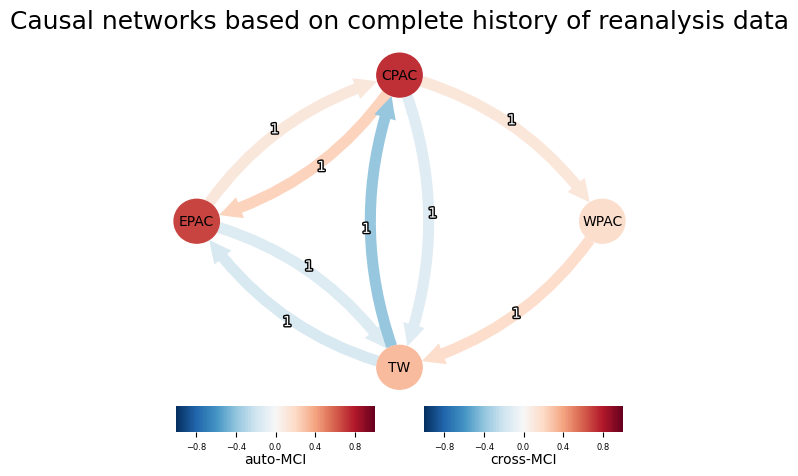

In [24]:
four_node_complete_history_reanalysis_results = link_robustness_complete_reanalysis(extended_data, ParCorr(), tau_max=1, tau_min=1, extended = 1, info = True, model = 'reanalysis')

## The output data

We can store the values of the DAG in the value matrix and the confidence interval matrix. This will give us an easy way to refer back to them in our later on analysis. 

In [25]:
value_matrix = four_node_complete_history_reanalysis_results['val_matrix']

In [26]:
ci_matrix = four_node_complete_history_reanalysis_results['conf_matrix']

The val_matrix returns an array of shape (N, N, tau_max+1). It is an estimated matrix of test statistic values. An entry val_matrix[i,j,tau] gives the coefficient from link i to j at lag tau, with tau=0 in the first column. 

EXAMPLE: Since our column and row names are ['WPAC','CPAC','EPAC','TW'], this means that val_matrix[0,0,1] is the auto-MCI from WPAC at time t-1 to WPAC at time 0. And val_matrix[3,2,1] is the cross-MCI from TW to EPAC across time. All values [., ., 0] are zero since there is no causal effects on the variables at this exact time.

In [27]:
#print(value_matrix)

The conf_matrix returns an array of shape (N, N, tau_max+1, 2). It is an estimated matrix of confidence intervals of test statistic values. Only computed if set in cond_ind_test, where also the percentiles are set. I think they have the same output as the val_matrix in terms of the order variables are stored, only now with 2 values per link; the lower and upper bound of the confidence intervals.

EXAMPLE: Again, use our row and column names['WPAC','CPAC','EPAC','TW']. Then conf_matrix[0,0,1,1] is the upper-bound of the auto-MCI from WPAC at time t-1 to WPAC at time 0. And conf_matrix[3,2,1,0] is the lower-bound of the cross-MCI from TW to EPAC across time. All values [., ., 0, .] are zero since there is no causal effects on the variables at this exact time.

In [28]:
#print(ci_matrix)

# Dataset based on DAG

We assume that the DAG from last section is based on a VAR(1) process, where the causal links can be described by the values of the val_matrix. Therefore, we will store them in a Phi matrix. The Phi matrix is made up of 4 rows and 4 columns, where each row corresponds to the target variable, and each row to the source variable. We only use the intertemporal links, so the second columns. 

## Phi matrix and bounds

In [29]:
Phi = np.zeros((4,4))

In [30]:
for i in range(0,4):
    for j in range(0,4):
        Phi[i,j] = value_matrix[j,i,1]

In [31]:
print(len(Phi))

4


We can do the same kind of thing for the lower-bounds of the Phi matrix, as well as the upper-bounds of the Phi matrix, storing them in two separate matrices.

In [32]:
Phi_lowerbounds = np.zeros((4,4))
Phi_upperbounds = np.zeros((4,4))

In [33]:
for i in range(0,4):
    for j in range(0,4):
        Phi_lowerbounds[i,j] = ci_matrix[j,i,1,0]
        Phi_upperbounds[i,j] = ci_matrix[j,i,1,1]

In [34]:
print("Lower bounds:")
print(Phi_lowerbounds)
print("Upper bounds:")
print(Phi_upperbounds)

Lower bounds:
[[ 0.11062203  0.0554737  -0.04059652 -0.01599958]
 [ 0.00580495  0.70998061  0.046888   -0.4375213 ]
 [-0.06890797  0.17042017  0.64575904 -0.22426764]
 [ 0.12098182 -0.18672935 -0.20084539  0.25569243]]
Upper bounds:
[[ 0.23477964  0.1825624   0.08923813  0.11368664]
 [ 0.13478926  0.75124236  0.17444862 -0.33566336]
 [ 0.061141    0.29004557  0.69845511 -0.0993085 ]
 [ 0.2445472  -0.05973997 -0.07448789  0.36730951]]


## Functions for dataset

In [35]:
def CheckStability(phi):
    """
    Function to check the stability as definned by Lutkepohl (2005). 
    All eigenvalues of matrix phi (if p=1) should have modulus smaller than one.
    """
    
    eigenvalues = np.linalg.eigvals(phi)
    abs_eigenvalues = np.abs(eigenvalues)
    
    score = 0
    for i in range(len(abs_eigenvalues)):
        if abs_eigenvalues[i] > 1:
            score += 1
    
    if score == 0:
        stability = True
    else:
        stability = False
    
    return stability

In [36]:
def Error(phi, T, standard=True, seed=None):
    """
    Generate an error term with the same length as the phi matrix of the problem.
    """
    if seed is not None:
        np.random.seed(seed)
    
    n = len(phi)  
    
    if standard:
        sigma = np.eye(n)
    else:
        sigma = np.diag(np.random.uniform(-1, 1, n))
    
    epsilon = np.random.multivariate_normal(np.zeros(n), sigma, T).T
    
    return epsilon, sigma

In [37]:
def Constant(phi, constant_term=False, seed=None):
    """
    Generate a constant term with the same length as the phi matrix of the problem.
    """
    
    if seed is not None:
        np.random.seed(seed)

    n = len(phi)  
    
    if constant_term:
        C = np.random.randn(n,1)
    else:
        C = np.zeros((n,1))
    
    return C

In [38]:
def Time_Series(phi, C, epsilon, T, initial_mean, initial_var, seed=None):
    """
    Generate time series based on an input phi matrix, constant and error term.
    initial_mean: list/array of means for each variable
    initial_variance: list/array of variances for each variable
    """
    if seed is not None:
        np.random.seed(seed)

    n = len(phi)  
    Y = np.zeros((n, T))
    # We initialize the time series with a random normal variable form the initial mean and variance as input.
    for i in range(n):
        Y[i, 0] = np.random.normal(initial_mean[i], initial_var[i]) 
    
    for t in range(1,T):
        for i in range(n):
            Y[i,t] += C[i] # Add the constant
            for j in range(n):
                Y[i,t] += (phi[i,j])*(Y[j,t-1]) # Add the phi-term
            Y[i,t] += epsilon[i,t-1] # Add the error

    return Y

In [39]:
def GenerateVAR(phi, T, initial_mean, initial_var, constant_term=False, standard_error_distribution=True, seed=None):
    """
    Bring all the functions together so we can run it with just one click.
    """
    
    "Check stability of Phi matrix"
    stability = CheckStability(phi)
    if stability == False:
        print("WARNING: please note that the input phi matrix is not stable.")
        #print("The input Phi is stable!")

    "Generate Error Term"
    epsilon, sigma = Error(phi, T, standard=standard_error_distribution, seed=seed)
    
    "Generate Constant Term"
    C = Constant(phi, constant_term=constant_term, seed=seed)
    
    "Generate Time Series"
    Y = Time_Series(phi, C, epsilon, T, initial_mean, initial_var, seed=seed)
    
    return Y, C, epsilon, sigma

In [40]:
def GenerateDF(data, yearly=False, freq='ME', column_names=['WPAC','CPAC','EPAC','TW']):
    """
    This function generates a dataframe that we can use easily. 
    It will transpose the dataset so that we have rows of years and columns of variables, instead of the other way around.
    """
    
    # Make it a df and transpose the dataset (needed for Tigramite)
    df = pd.DataFrame(data)
    df = df.T
    
    if yearly == True:
        rows = list(range(2015-len(df), 2015))
    # Generate the names for the columns and rows
    #rows = list(range(start_year, start_year + df.shape[0]))  <--- yearly
    else:
        rows = pd.date_range(start=f'1982-01', periods=df.shape[0], freq=freq)  
        
    # Assign the names to the columns and rows
    df.index = rows
    df.columns = column_names
    
    # We will also be using a Tigramite df so let's return that as well
    # Note that a Tigramite dataframe needs to be of size Txn 
    dfT = pp.DataFrame(df.values, var_names=df.columns.tolist(), datatime=df.index.tolist())

    return df, dfT

## Generate datasets

Now we can generate the datasets for different seeds and time-lengths. We will store them using names that refer to the length of the data.

In [81]:
data_396, constant_term_396, error_term_396, sigma_396 = GenerateVAR(Phi, 396, means, variances, seed=396)
df_396, dfT_396 = GenerateDF(data_396)

In [82]:
data_198, constant_term_198, error_term_198, sigma_198 = GenerateVAR(Phi, 198, means, variances, seed=198)
df_198, dfT_198 = GenerateDF(data_198, freq='2ME') # per 2 months. Or fill in nothign for frequency and set start year to 1990 or something

In [83]:
data_1722, constant_term_1722, error_term_1722, sigma_1722 = GenerateVAR(Phi, 1722, means, variances, seed=1722)
df_1722, dfT_1722 = GenerateDF(data_1722, freq='W')

In [84]:
data_12053, constant_term_12053, error_term_12053, sigma_12053 = GenerateVAR(Phi, 12053, means, variances, seed=12053)
df_12053, dfT_12053 = GenerateDF(data_12053, freq='D')

Later on we could make a function that will run through the two functions, filling in different T's so that we can easily plot it with T on the x-axis and the correctness on the y-axis. For now we will just check these four different sets.

## Plot datasets

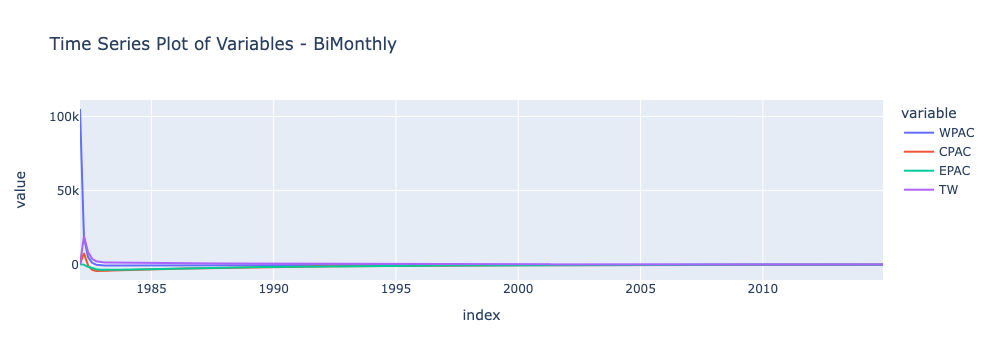

In [85]:
fig = px.line(df_198, x=df_198.index, y=df_198.columns, title='Time Series Plot of Variables - BiMonthly')
fig.show()
#fig = go.Figure()
#for column in df_198.columns:
#    fig.add_trace(go.Histogram(x=df_198[column], name=column, opacity=0.75))
#fig.update_layout(
#    barmode='overlay',
#    title='Distribution of Variables',
#    xaxis_title='Value',
#    yaxis_title='Count',
#    legend_title='Variable'
#)
#fig.show()

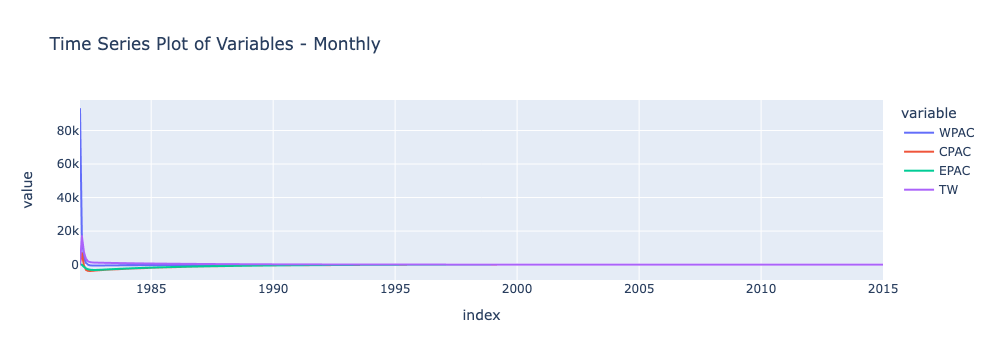

In [86]:
fig = px.line(df_396, x=df_396.index, y=df_396.columns, title='Time Series Plot of Variables - Monthly')
fig.show()

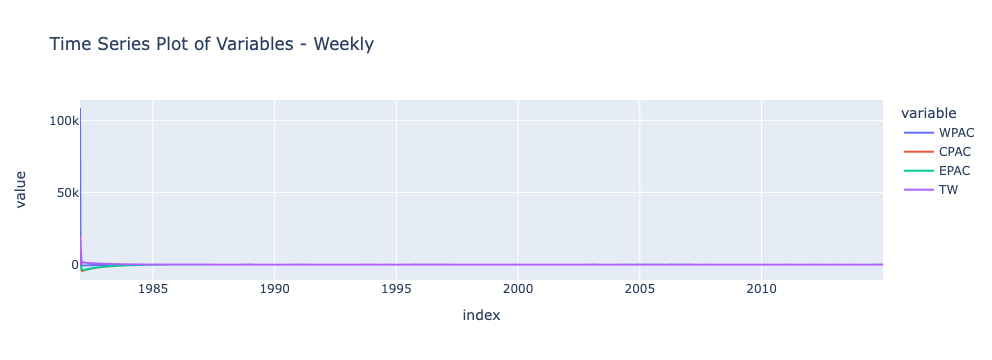

In [87]:
fig = px.line(df_1722, x=df_1722.index, y=df_1722.columns, title='Time Series Plot of Variables - Weekly')
fig.show()

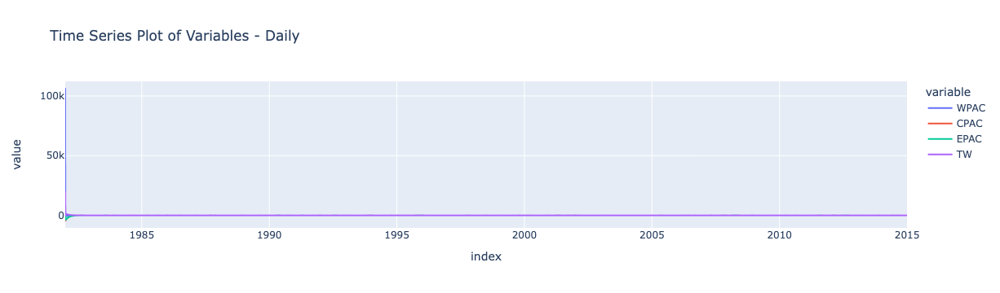

In [88]:
fig = px.line(df_12053, x=df_12053.index, y=df_12053.columns, title='Time Series Plot of Variables - Daily')
fig.show()

# Run PCMCI and compare

I will make function that runs the PCMCI for a series of inputs and gives all the conf_int and val_matrix outputs etc compared directly to that of base model set.

In [41]:
parcorr = ParCorr(confidence='analytic', mask_type='y')

## The four practice datasets

### Functions

In [42]:
def SpringBarrierMask(df_processed, period):
    
    mask = np.ones(df_processed.shape, dtype=bool)

    days_per_period = 365 // period
    feb_start = 31 // days_per_period
    may_start = 120 // days_per_period

    indices_not_to_mask_to_feb = list(range(0,feb_start))
    indices_to_mask = list(range(feb_start, may_start))
    indices_not_to_mask_from_apr = list(range(may_start, period))
                                        
    #print("Not mask:")
    #print(indices_not_to_mask_to_feb)
    #print("Mask:", indices_to_mask)
    #print("Not mask:", indices_not_to_mask_from_apr)
    
    indices_not_to_mask = indices_not_to_mask_to_feb + indices_not_to_mask_from_apr
    #print("Full list:", indices_not_to_mask)
                                        
    for i in indices_not_to_mask:
        mask[i::period, :] = False
    #print(mask)
    return mask

In [43]:
def Run_PCMCI(df, parcorr, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], period=12, model = 'model'):

    cpac_detrend = deTrend_deSeasonalize(df['CPAC'], period=period, show_plot = False)
    epac_detrend = deTrend_deSeasonalize(df['EPAC'], period=period, show_plot = False)
    wpac_detrend = deTrend_deSeasonalize(df['WPAC'], period=period, show_plot = False)
    tw_detrend = deTrend_deSeasonalize(df['TW'], period=period, show_plot = False)
    
    df_processed = pd.DataFrame({'WPAC': wpac_detrend, 'CPAC': cpac_detrend, 'EPAC': epac_detrend, 'TW': tw_detrend})
            
    # Construct mask for spring barrier
    springbarrier_mask = SpringBarrierMask(df_processed, period)
    
    dfT = pp.DataFrame(np.copy(df_processed), datatime = {0:np.arange(len(df_processed))}, var_names= var_names, mask = springbarrier_mask)
    pcmci = PCMCI(dataframe=dfT, cond_ind_test=parcorr,verbosity=0)
    results = pcmci.run_pcmci(tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, fdr_method = 'fdr_bh')
    
    # Plot the graph
    tp.plot_graph(
        val_matrix=results['val_matrix'],
        graph=results['graph'],
        var_names=var_names,
        link_colorbar_label='cross-MCI',
        node_colorbar_label='auto-MCI')
    plt.title(f'Causal networks based on complete history of {model} data', fontsize = 18)
    plt.show()
    
    return results

In [44]:
def Run_PCMCI_yearly(df, parcorr, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = 'model', plot=True):

    cpac_detrend = deTrend_deSeasonalize(df['CPAC'], period=12, show_plot = False)
    epac_detrend = deTrend_deSeasonalize(df['EPAC'], period=12, show_plot = False)
    wpac_detrend = deTrend_deSeasonalize(df['WPAC'], period=12, show_plot = False)
    tw_detrend = deTrend_deSeasonalize(df['TW'], period=12, show_plot = False)
    
    df_processed = pd.DataFrame({'WPAC': wpac_detrend, 'CPAC': cpac_detrend, 'EPAC': epac_detrend, 'TW': tw_detrend})
            
    # Construct mask for spring barrier
    cycle_length = 12
    springbarrier_mask = np.ones(df_processed.shape, dtype=bool)
    for i in [4, 5, 6, 7, 8, 9, 10, 11, 0]:
        springbarrier_mask[i::cycle_length, :] = False
        
    dfT = pp.DataFrame(np.copy(df_processed), datatime = {0:np.arange(len(df_processed))}, var_names= var_names, mask = springbarrier_mask)
    pcmci = PCMCI(dataframe=dfT, cond_ind_test=parcorr,verbosity=0)
    results = pcmci.run_pcmci(tau_max=tau_max, tau_min=tau_min, pc_alpha=pc_alpha, alpha_level=alpha_level, fdr_method = 'fdr_bh')
    
    if plot==True:
        # Plot the graph
        tp.plot_graph(
            val_matrix=results['val_matrix'],
            graph=results['graph'],
            var_names=var_names,
            link_colorbar_label='cross-MCI',
            node_colorbar_label='auto-MCI')
        plt.title(f'Causal networks based on {model} data', fontsize = 18)
        plt.show()
    
    return results

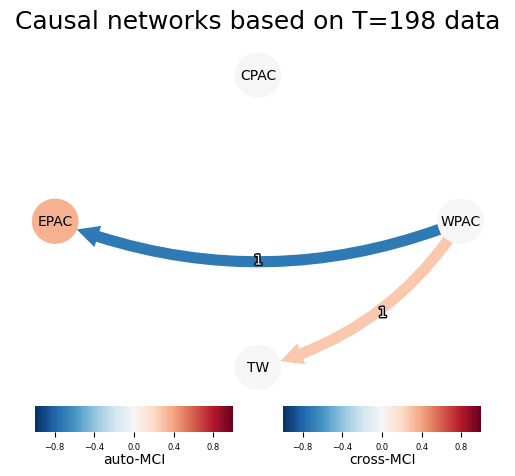

In [93]:
results_198 = Run_PCMCI_yearly(df_198, parcorr, model='T=198') # not yearly: add period=6
value_matrix_198 = results_198['val_matrix']
ci_matrix_198 = results_198['conf_matrix']

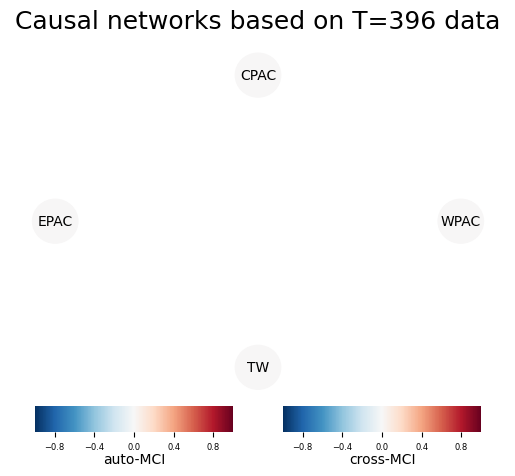

In [94]:
results_396 = Run_PCMCI_yearly(df_396, parcorr, model='T=396')
value_matrix_396 = results_396['val_matrix']
ci_matrix_396 = results_396['conf_matrix']

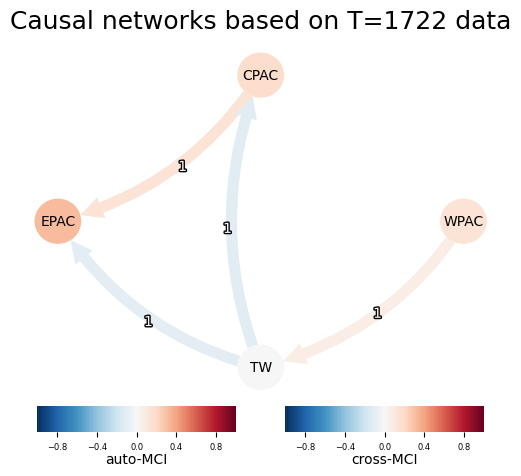

In [95]:
results_1722 = Run_PCMCI_yearly(df_1722, parcorr, model='T=1722') # not yearly: add period=52
value_matrix_1722 = results_1722['val_matrix']
ci_matrix_1722 = results_1722['conf_matrix']

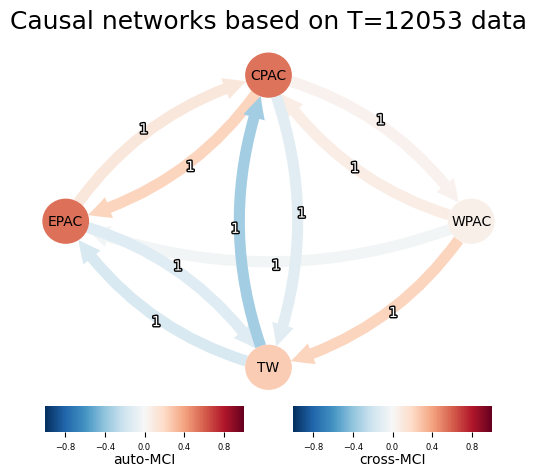

In [96]:
results_12053 = Run_PCMCI_yearly(df_12053, parcorr, model='T=12053') #period=36
value_matrix_12053 = results_12053['val_matrix']
ci_matrix_12053 = results_12053['conf_matrix']

### Comparison with the original

We will develop a way to compare the outputs to the original. Remember that:

The val_matrix returns an array of shape (N, N, tau_max+1). It is an estimated matrix of test statistic values. An entry val_matrix[i,j,tau] gives the coefficient from link i to j at lag tau, with tau=0 in the first column. EXAMPLE: Since our column and row names are ['WPAC','CPAC','EPAC','TW'], this means that val_matrix[0,0,1] is the auto-MCI from WPAC at time t-1 to WPAC at time 0. And val_matrix[3,2,1] is the cross-MCI from TW to EPAC across time. All values [., ., 0] are zero since there is no causal effects on the variables at this exact time.

The conf_matrix returns an array of shape (N, N, tau_max+1, 2). It is an estimated matrix of confidence intervals of test statistic values. Only computed if set in cond_ind_test, where also the percentiles are set. I think they have the same output as the val_matrix in terms of the order variables are stored, only now with 2 values per link; the lower and upper bound of the confidence intervals. EXAMPLE: Again, use our row and column names['WPAC','CPAC','EPAC','TW']. Then conf_matrix[0,0,1,1] is the upper-bound of the auto-MCI from WPAC at time t-1 to WPAC at time 0. And val_matrix[3,2,1,0] is the lower-bound of the cross-MCI from TW to EPAC across time. All values [., ., 0, .] are zero since there is no causal effects on the variables at this exact time.

We stored the information from the original in 'value_matrix' and 'ci_matrix'. The information from the runs are stored in 'value_matrix_T' and 'ci_matrix_T', where T is equivalent to the length of time. 

Now we can define a function that iterates over the entries of the value matrices and compares them to the original baseline value matrix. If the value is more or less than an 'alpha' from the baseline value, then we can see this as a fail. In the end we are left with a value that explains the percentage that the model was able to describe within the alpha confidence interval. 

Alternatively we could use the confidence intervals.

In [45]:
def ComparisonStatistic(baseline_conf_matrix, val_matrix):
    """
    This function can be used to develop a statistic that explains how much of the input val_matrix explains the baseline val_matrix correctly.
    It now only checks whether it falls within the confidence bounds, 
    but could also be extended to include how close it is to the real value in baseline_val_matrix.
    """
    
    n, _, _ = val_matrix.shape
        
    check = np.zeros((n,n))
    
    for i in range(n):
        for j in range(n):
            value = val_matrix[j,i,1]
            lower_bound = baseline_conf_matrix[j,i,1,0]
            upper_bound = baseline_conf_matrix[j,i,1,1]
            if (value > lower_bound) and (value < upper_bound):
                check[j, i] = 1
    
    correct = np.count_nonzero(check == 1)
    stats = (correct / check.size) * 100
    
    return stats, check

In [98]:
stat_198, correct_matrix_198 = ComparisonStatistic(ci_matrix, value_matrix_198)
stat_396, correct_matrix_396 = ComparisonStatistic(ci_matrix, value_matrix_396)
stat_1722, correct_matrix_1722 = ComparisonStatistic(ci_matrix, value_matrix_1722)
stat_12053, correct_matrix_12053 = ComparisonStatistic(ci_matrix, value_matrix_12053)

In [99]:
print("Correctness of T=198 dataset:", stat_198,"%")
print("Correctness of T=396 dataset:", stat_396,"%")
print("Correctness of T=1722 dataset:", stat_1722,"%")
print("Correctness of T=12053 dataset:", stat_12053,"%")

Correctness of T=198 dataset: 25.0 %
Correctness of T=396 dataset: 31.25 %
Correctness of T=1722 dataset: 37.5 %
Correctness of T=12053 dataset: 75.0 %


## Automization of the process

Now we will focus on automizing the process so we can run it for a lot of different time periods and compare statistics.

In [46]:
def Run_and_Compare_PCMCI(phi, initial_mean, initial_var, conf_matrix, parcorr, intervals=50, min_T=50, max_T=100000, plot=False, seed=None):
    """
    Values
    """
    
    l = (max_T - min_T)//intervals
    statistics = np.zeros((l,2))
    i = 0
    
    for t in range(min_T, max_T, intervals):
        if seed==None:
            data, _, _, _ = GenerateVAR(phi, t, initial_mean, initial_var, seed=t) 
        else:
            data, _, _, _ = GenerateVAR(phi, t, initial_mean, initial_var, seed=seed) 

        df, _ = GenerateDF(data, yearly=True)
        
        results = Run_PCMCI_yearly(df, parcorr, tau_max=1, tau_min=1, pc_alpha=0.1, alpha_level=0.05, var_names = ['WPAC', 'CPAC', 'EPAC', 'TW'], model = f'T={t}', plot=plot)
        value_matrix = results['val_matrix']
        
        stat, correct_matrix = ComparisonStatistic(conf_matrix, value_matrix)
        
        statistics[i,0] = t
        statistics[i,1] = stat
        
        if i%20 ==0:
            print(f"loading... {np.round((i/l)*100)}%")
        
        i += 1
    
    df = pd.DataFrame(statistics, columns=['T','Statistic Value'])
    df.set_index('T', inplace=True)
    
    fig = px.line(df, x=df.index, y=df.columns, title='Correctness Statistic')
    fig.update_layout(yaxis_title='% within confidence bounds')
    fig.update_layout(xaxis_title='Number of time periods T in dataset')
    # Add the trend line to the plot
    x = df.index.values
    y = df['Statistic Value'].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    fig.add_trace(go.Scatter(x=x, y=p(x), mode='lines', name='Trend Line', line=dict(color='grey', dash='dash')))

    fig.show()
    
    return statistics, df, fig

### Different examples

loading... 0.0%
loading... 7.0%
loading... 13.0%
loading... 20.0%
loading... 27.0%
loading... 33.0%
loading... 40.0%
loading... 47.0%
loading... 54.0%
loading... 60.0%
loading... 67.0%
loading... 74.0%
loading... 80.0%
loading... 87.0%
loading... 94.0%


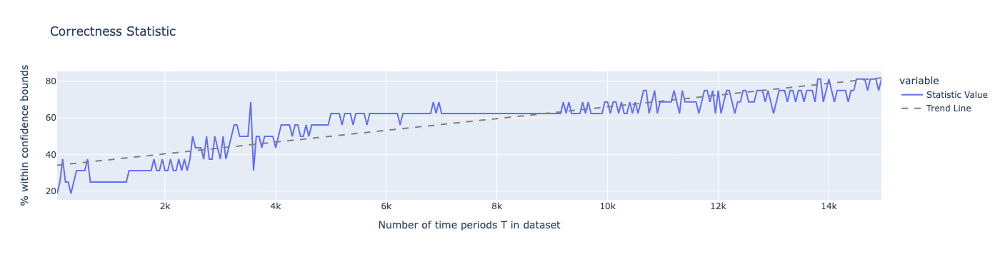

In [101]:
statistics, statistics_df, statistics_fig = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=50, min_T=50, max_T=15000)

We could also draw the scattered data with a trendline in the following manner:
#statistics_fig = px.scatter(statistics_df, trendline="ols")
#statistics_fig.show()

loading... 0.0%
loading... 7.0%
loading... 13.0%
loading... 20.0%
loading... 27.0%
loading... 33.0%
loading... 40.0%
loading... 47.0%
loading... 54.0%
loading... 60.0%
loading... 67.0%
loading... 74.0%
loading... 80.0%
loading... 87.0%
loading... 94.0%


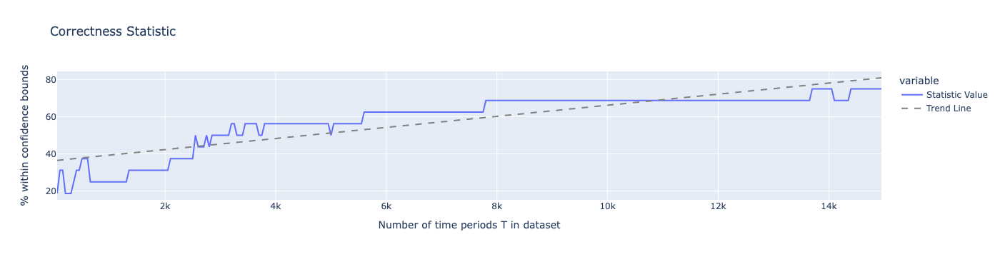

In [102]:
statistics_2, statistics_df_2, statistics_fig_2 = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=50, min_T=50, max_T=15000, seed=123)

loading... 0.0%
loading... 1.0%
loading... 3.0%
loading... 4.0%
loading... 6.0%
loading... 7.0%
loading... 8.0%
loading... 10.0%
loading... 11.0%
loading... 12.0%
loading... 14.0%
loading... 15.0%
loading... 17.0%
loading... 18.0%
loading... 19.0%
loading... 21.0%
loading... 22.0%
loading... 23.0%
loading... 25.0%
loading... 26.0%
loading... 28.0%
loading... 29.0%
loading... 30.0%
loading... 32.0%
loading... 33.0%
loading... 34.0%
loading... 36.0%
loading... 37.0%
loading... 39.0%
loading... 40.0%
loading... 41.0%
loading... 43.0%
loading... 44.0%
loading... 46.0%
loading... 47.0%
loading... 48.0%
loading... 50.0%
loading... 51.0%
loading... 52.0%
loading... 54.0%
loading... 55.0%
loading... 57.0%
loading... 58.0%
loading... 59.0%
loading... 61.0%
loading... 62.0%
loading... 63.0%
loading... 65.0%
loading... 66.0%
loading... 68.0%
loading... 69.0%
loading... 70.0%
loading... 72.0%
loading... 73.0%
loading... 74.0%
loading... 76.0%
loading... 77.0%
loading... 79.0%
loading... 80.0%
load

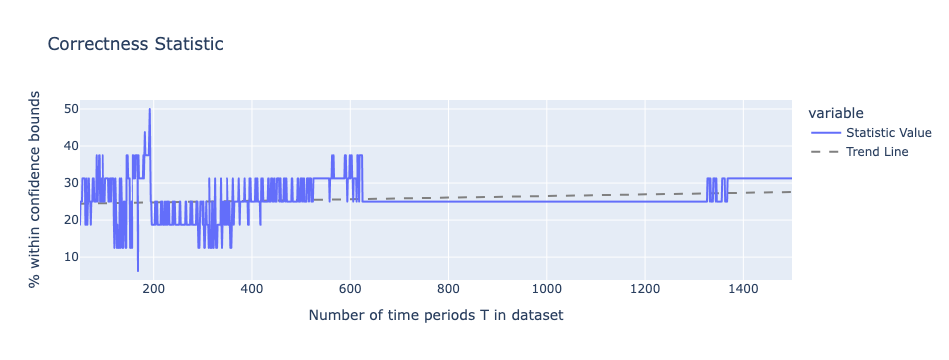

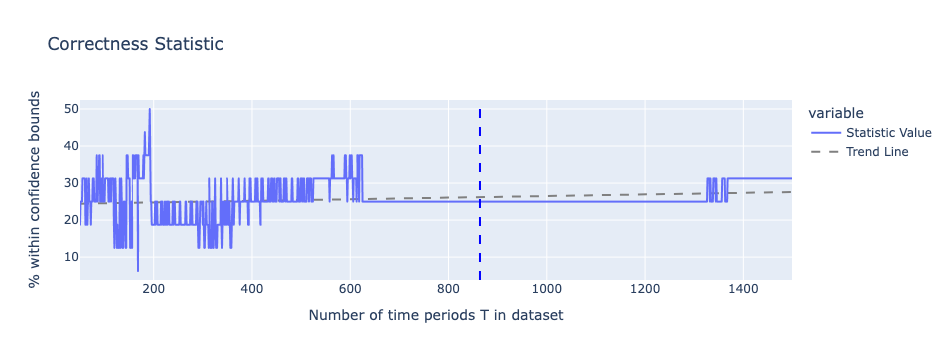

In [103]:
statistics_3, statistics_df_3, statistics_fig_3 = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=1, min_T=50, max_T=1500, seed=333)
statistics_fig_3.add_vline(x=864, line_dash="dash", line_color="blue")

loading... 0.0%
loading... 1.0%
loading... 3.0%
loading... 4.0%
loading... 6.0%
loading... 7.0%
loading... 9.0%
loading... 10.0%
loading... 12.0%
loading... 13.0%
loading... 15.0%
loading... 16.0%
loading... 18.0%
loading... 19.0%
loading... 21.0%
loading... 22.0%
loading... 24.0%
loading... 25.0%
loading... 27.0%
loading... 28.0%
loading... 30.0%
loading... 31.0%
loading... 33.0%
loading... 34.0%
loading... 36.0%
loading... 37.0%
loading... 39.0%
loading... 40.0%
loading... 41.0%
loading... 43.0%
loading... 44.0%
loading... 46.0%
loading... 47.0%
loading... 49.0%
loading... 50.0%
loading... 52.0%
loading... 53.0%
loading... 55.0%
loading... 56.0%
loading... 58.0%
loading... 59.0%
loading... 61.0%
loading... 62.0%
loading... 64.0%
loading... 65.0%
loading... 67.0%
loading... 68.0%
loading... 70.0%
loading... 71.0%
loading... 73.0%
loading... 74.0%
loading... 76.0%
loading... 77.0%
loading... 79.0%
loading... 80.0%
loading... 81.0%
loading... 83.0%
loading... 84.0%
loading... 86.0%
load

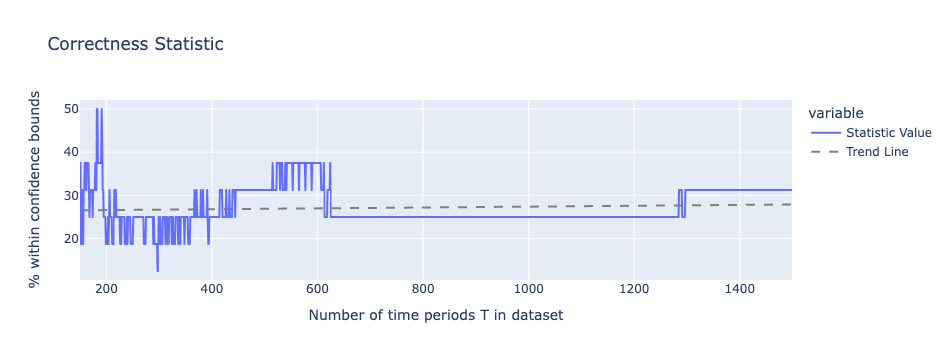

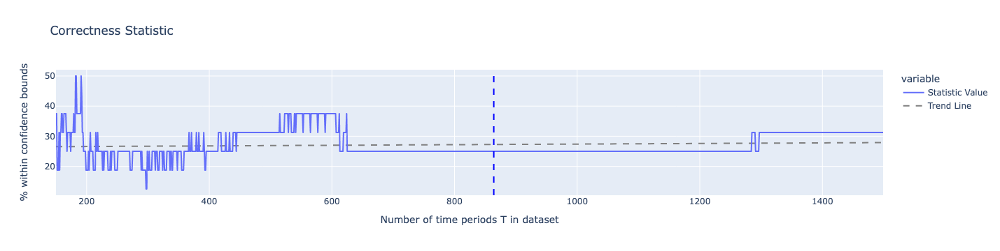

In [104]:
statistics_4, statistics_df_4, statistics_fig_4 = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=1, min_T=150, max_T=1500, seed=666)
statistics_fig_4.add_vline(x=864, line_dash="dash", line_color="blue")

loading... 0.0%
loading... 1.0%
loading... 3.0%
loading... 4.0%
loading... 6.0%
loading... 7.0%
loading... 9.0%
loading... 10.0%
loading... 12.0%
loading... 13.0%
loading... 15.0%
loading... 16.0%
loading... 18.0%
loading... 19.0%
loading... 21.0%
loading... 22.0%
loading... 24.0%
loading... 25.0%
loading... 27.0%
loading... 28.0%
loading... 30.0%
loading... 31.0%
loading... 33.0%
loading... 34.0%
loading... 36.0%
loading... 37.0%
loading... 39.0%
loading... 40.0%
loading... 41.0%
loading... 43.0%
loading... 44.0%
loading... 46.0%
loading... 47.0%
loading... 49.0%
loading... 50.0%
loading... 52.0%
loading... 53.0%
loading... 55.0%
loading... 56.0%
loading... 58.0%
loading... 59.0%
loading... 61.0%
loading... 62.0%
loading... 64.0%
loading... 65.0%
loading... 67.0%
loading... 68.0%
loading... 70.0%
loading... 71.0%
loading... 73.0%
loading... 74.0%
loading... 76.0%
loading... 77.0%
loading... 79.0%
loading... 80.0%
loading... 81.0%
loading... 83.0%
loading... 84.0%
loading... 86.0%
load

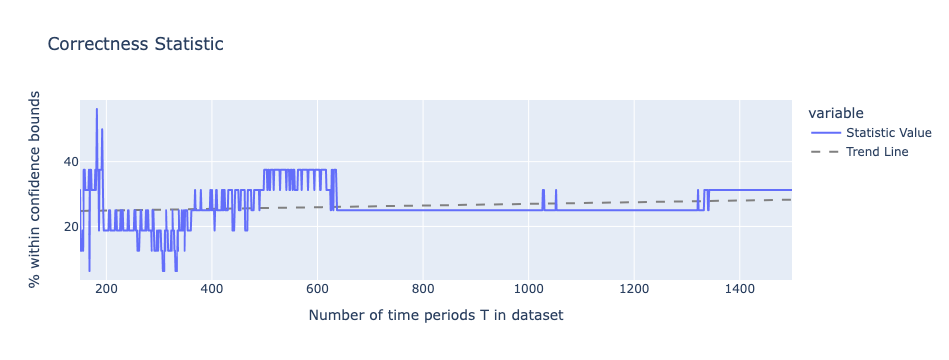

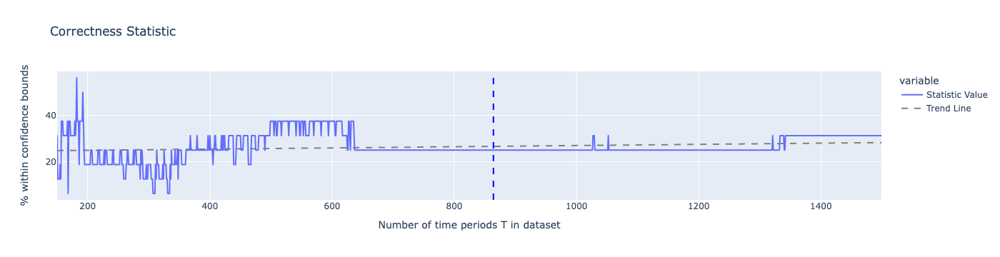

In [105]:
statistics_5, statistics_df_5, statistics_fig_5 = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=1, min_T=150, max_T=1500, seed=123)
statistics_fig_5.add_vline(x=864, line_dash="dash", line_color="blue")

loading... 0.0%
loading... 1.0%
loading... 3.0%
loading... 4.0%
loading... 6.0%
loading... 7.0%
loading... 9.0%
loading... 10.0%
loading... 12.0%
loading... 13.0%
loading... 15.0%
loading... 16.0%
loading... 18.0%
loading... 19.0%
loading... 21.0%
loading... 22.0%
loading... 24.0%
loading... 25.0%
loading... 27.0%
loading... 28.0%
loading... 30.0%
loading... 31.0%
loading... 33.0%
loading... 34.0%
loading... 36.0%
loading... 37.0%
loading... 39.0%
loading... 40.0%
loading... 41.0%
loading... 43.0%
loading... 44.0%
loading... 46.0%
loading... 47.0%
loading... 49.0%
loading... 50.0%
loading... 52.0%
loading... 53.0%
loading... 55.0%
loading... 56.0%
loading... 58.0%
loading... 59.0%
loading... 61.0%
loading... 62.0%
loading... 64.0%
loading... 65.0%
loading... 67.0%
loading... 68.0%
loading... 70.0%
loading... 71.0%
loading... 73.0%
loading... 74.0%
loading... 76.0%
loading... 77.0%
loading... 79.0%
loading... 80.0%
loading... 81.0%
loading... 83.0%
loading... 84.0%
loading... 86.0%
load

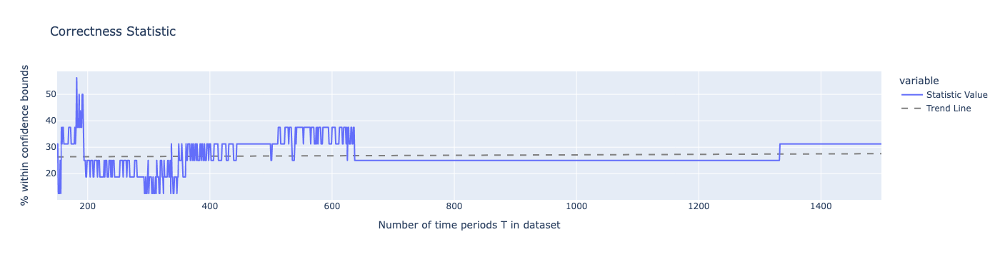

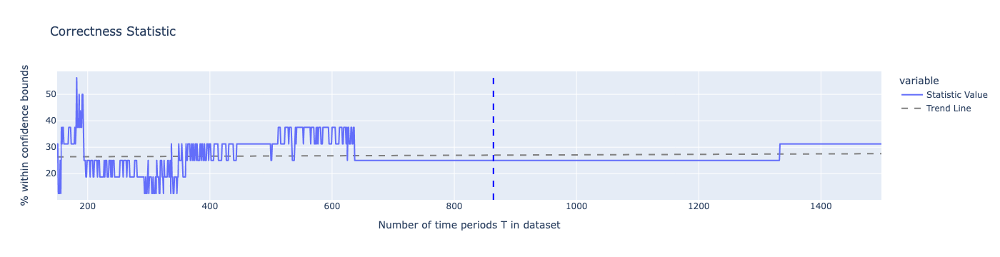

In [106]:
statistics_6, statistics_df_6, statistics_fig_6 = Run_and_Compare_PCMCI(Phi, means, variances, ci_matrix, parcorr, intervals=1, min_T=150, max_T=1500, seed=456)
statistics_fig_6.add_vline(x=864, line_dash="dash", line_color="blue")

# Run Bagging and compare

Next to the PCMCI algorithm, we could also use the extended 'Bagging' algorithm. We will first need to define the right functions, and then we can again automize the process and check different examples.

## Functions

In [107]:
def Run_Bagging(df, tau_max=1, boot_samples=200, boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot=True, model=''):
        
    cpac_detrend = deTrend_deSeasonalize(df['CPAC'], period=12, show_plot = False)
    epac_detrend = deTrend_deSeasonalize(df['EPAC'], period=12, show_plot = False)
    wpac_detrend = deTrend_deSeasonalize(df['WPAC'], period=12, show_plot = False)
    tw_detrend = deTrend_deSeasonalize(df['TW'], period=12, show_plot = False)
    
    df_processed = pd.DataFrame({'WPAC': wpac_detrend, 'CPAC': cpac_detrend, 'EPAC': epac_detrend, 'TW': tw_detrend})
    
    var_names = df.columns.tolist()
    
    df_tigramite = pp.DataFrame(df.values,
                                datatime=np.arange(df.shape[0]),
                                var_names=var_names)
    
    # Construct mask for spring barrier
    cycle_length = 12
    springbarrier_mask = np.ones(df_processed.shape, dtype=bool)
    for i in [4, 5, 6, 7, 8, 9, 10, 11, 0]:
        springbarrier_mask[i::cycle_length, :] = False
    
    #Now let's run it:
    
    pcmci = PCMCI(dataframe=df_tigramite,
        cond_ind_test=test,
        verbosity=0,
        )
    
    results = pcmci.run_bootstrap_of(
        method='run_pcmciplus', 
        method_args={'tau_max':tau_max, 'pc_alpha':pc_alpha_bootstrap}, 
        boot_samples=boot_samples,
        boot_blocklength=boot_blocklength,
        seed=123)
    
    if plot == True:
        # Output graph, link frequencies (confidence measure), and mean test statistic values (val_mat)
        boot_linkfreq = results['summary_results']['link_frequency']
        boot_graph = results['summary_results']['most_frequent_links']
        val_mat = results['summary_results']['val_matrix_mean']
    
        tp.plot_graph(
            graph = boot_graph,
            val_matrix= val_mat,
            link_width = boot_linkfreq,
            var_names=df_tigramite.var_names,
            )
        plt.title(f'Causal networks using Bagging based on {model} data', fontsize=16)
        plt.show()
        
    return results

In [108]:
def MakeData_RunBagging(mean_val_matrix, T, initial_mean, initial_var, constant_term=False, standard_error_distribution=True, seed=None, 
                        plot_data=True, yearly=False, freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], 
                        tau_max=1, boot_samples=200, boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot_DAG=True, model=''):
    
    "Generate a VAR model based on the outcome of bagging on the basemodel"
    # We generate a var using our function based on the mean_val_matrix that was output of the basemodel
    # And using the means and variances that fit the data of the basemodel
    # We also transform this into dataframes
    Y, C, epsilon, sigma = GenerateVARBagging(mean_val_matrix, T, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=seed)
    df, dfT = GenerateDF(Y, yearly=yearly, freq=freq, column_names=column_names)
    
    "Plot the data if wished for"
    if plot_data == True:
        fig = px.line(df, x=df.index, y=df.columns, title=f'Time Series Plot of Variables - Bagging Data based on seed={seed}')
        fig.show()
    
    "Run the bagging function to return the results of the bagging model"
    results = Run_Bagging(df, tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot=plot_DAG, model=model)

    return results, df, dfT, Y, C, epsilon, sigma

In [109]:
def MakeData_RunBagging_ComparisonStatistic(mean_val_matrix, ci_matrix, T, initial_mean, initial_var, constant_term=False, standard_error_distribution=True, seed=None, 
                        plot_data=True, yearly=False, freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], 
                        tau_max=1, boot_samples=200, boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot_DAG=True, model=''):
    
    "Generate a model and run bagging"
    results, df, dfT, Y, C, epsilon, sigma = MakeData_RunBagging(mean_val_matrix, T, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=seed, 
                        plot_data=plot_data, yearly=yearly, freq=freq, column_names=column_names, 
                        tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_DAG=plot_DAG, model=model)
    val_matrix = results['summary_results']['val_matrix_mean']
    
    "Generate the Comparison Statistic"
    comparison_statistic, check = ComparisonStatistic(ci_matrix_bagging_climate, val_matrix)
    
    return comparison_statistic, results, df, dfT, Y, C, epsilon, sigma, check

## The dataset

### Based on random phi

In [110]:
def Generate_Initial_Phi(n, seed=None):
    if seed is not None:
        np.random.seed(seed)
    
    Phi = np.zeros((n,n))
    stable_system = False
    while not stable_system:
        for i in range(4):
            for j in range(4):
                if i == j:
                    Phi[i,j] = np.random.uniform(0.8, 1.2)
                else:
                    Phi[i,j] = np.random.uniform(-1, 1)
        stable = CheckStability(Phi)
        if stable:
            stable_system = True

    return Phi

In [111]:
phi_bagging_example = Generate_Initial_Phi(4, seed=123)

In [112]:
data_bagging, constant_term_bagging, error_term_bagging, sigma_bagging = GenerateVAR(phi_bagging_example, 1000, [0,0,0,0], [1,1,1,1], constant_term=False, standard_error_distribution=True, seed=None) 
#The T does not matter since we will except the DAG to be true anyways

In [113]:
df_bagging, dfT_bagging = GenerateDF(data_bagging, yearly=True)

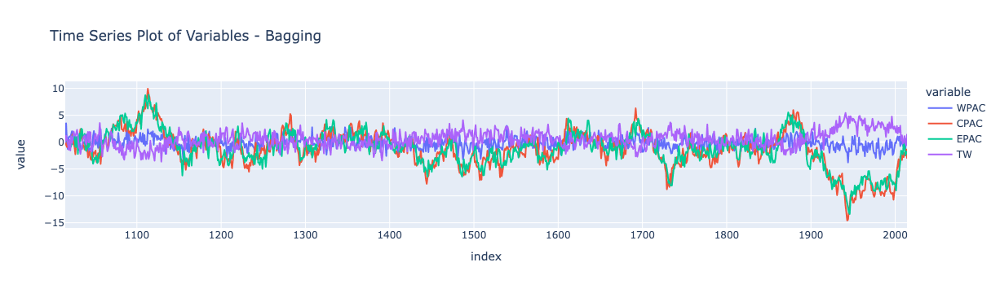

In [114]:
fig = px.line(df_bagging, x=df_bagging.index, y=df_bagging.columns, title='Time Series Plot of Variables - Bagging')
fig.show()

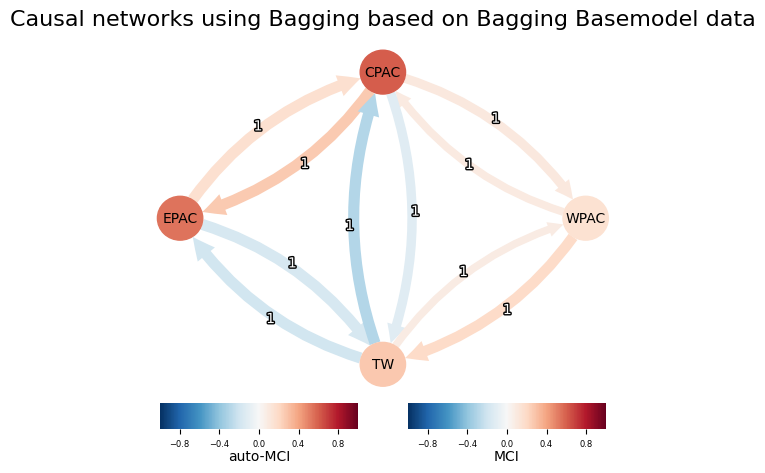

In [115]:
results_bagging = Run_Bagging(df_bagging, model='Bagging Basemodel') # Dit kan ook veranderen met df_extended_data om de climate data te gebruiken

In [116]:
value_matrix_bagging = results_bagging['summary_results']['val_matrix_mean']
ci_matrix_bagging = results_bagging['summary_results']['val_matrix_interval']

### Based on climate data

In [117]:
df_bagging_climate, dfT_bagging_climate = GenerateDF(extended_data.T, yearly=True)
#def GenerateDF(data, yearly=False, freq='ME', column_names=['WPAC','CPAC','EPAC','TW']):

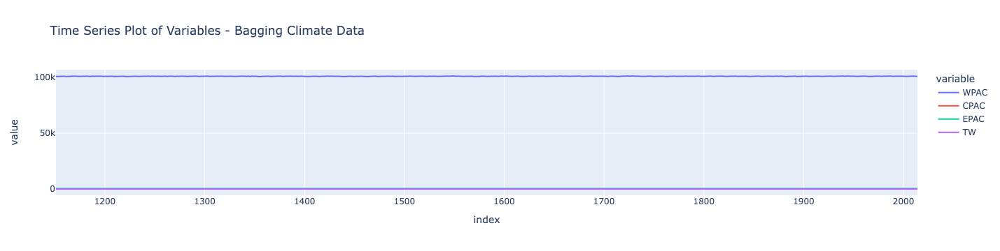

In [118]:
fig = px.line(df_bagging_climate, x=df_bagging_climate.index, y=df_bagging_climate.columns, title='Time Series Plot of Variables - Bagging Climate Data')
fig.show()

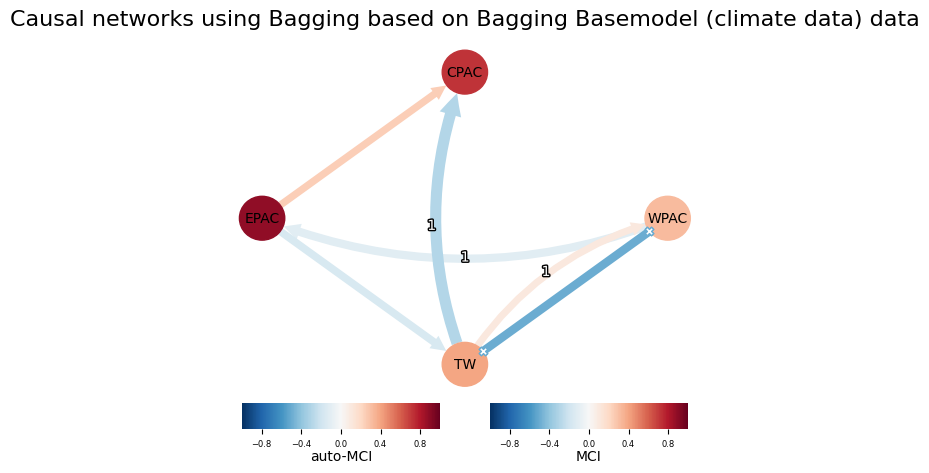

In [119]:
# Run_Bagging(df, tau_max=1, boot_samples=200, boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot=True, model=''):
# Notice that, for better results, we changed the parameters a bit, diverting from the default settings!
results_bagging_climate = Run_Bagging(df_bagging_climate, boot_samples=600,  model='Bagging Basemodel (climate data)') # Dit kan ook veranderen met df_extended_data om de climate data te gebruiken

In [120]:
value_matrix_bagging_climate = results_bagging_climate['summary_results']['val_matrix_mean']
ci_matrix_bagging_climate = results_bagging_climate['summary_results']['val_matrix_interval']

We can now use these variables to compare to the generated datasets and their outcomes!

## Datasets based on DAG

In [121]:
print('Val_matrix_mean')
print(results_bagging['summary_results']['val_matrix_mean'].shape)
print(results_bagging['summary_results']['val_matrix_mean'])
print('Val_matrix_interval')
print(results_bagging['summary_results']['val_matrix_interval'].shape)
print(results_bagging['summary_results']['val_matrix_interval'])

Val_matrix_mean
(4, 4, 2)
[[[ 0.          0.14943768]
  [ 0.04527113  0.0928249 ]
  [-0.04224352  0.0145653 ]
  [-0.03945693  0.1924034 ]]

 [[ 0.04527113  0.10629364]
  [ 0.          0.60381417]
  [-0.05513862  0.2642552 ]
  [-0.02334978 -0.11876083]]

 [[-0.04224352 -0.01734197]
  [-0.05513862  0.15680599]
  [ 0.          0.54080389]
  [ 0.00760846 -0.17175244]]

 [[-0.03945693  0.0847563 ]
  [-0.02334978 -0.29444687]
  [ 0.00760846 -0.18902614]
  [ 0.          0.26956077]]]
Val_matrix_interval
(4, 4, 2, 2)
[[[[ 0.          0.        ]
   [ 0.09664583  0.21502181]]

  [[ 0.00260061  0.09997979]
   [ 0.03024755  0.15750255]]

  [[-0.09157723  0.0100674 ]
   [-0.03548495  0.05756838]]

  [[-0.10126302  0.00667444]
   [ 0.14495098  0.24501076]]]


 [[[ 0.00260061  0.09997979]
   [ 0.02915394  0.18155275]]

  [[ 0.          0.        ]
   [ 0.57190685  0.63647898]]

  [[-0.11010236 -0.01007477]
   [ 0.22452029  0.30141818]]

  [[-0.06917002  0.02421607]
   [-0.17006966 -0.05075978]]]


 

In [122]:
num_vars = results_bagging['summary_results']['val_matrix_mean'].shape[0]

for i in range(num_vars):
    for j in range(num_vars):
        if i != j:  # Skip self-links
            mean_value = results_bagging['summary_results']['val_matrix_mean'][i, j]
            conf_interval = results_bagging['summary_results']['val_matrix_interval'][i, j]
            print(f"Link from {i} to {j}:")
            print(f"  Mean value: {mean_value}")
            print(f"  Confidence interval: {conf_interval}")

Link from 0 to 1:
  Mean value: [0.04527113 0.0928249 ]
  Confidence interval: [[0.00260061 0.09997979]
 [0.03024755 0.15750255]]
Link from 0 to 2:
  Mean value: [-0.04224352  0.0145653 ]
  Confidence interval: [[-0.09157723  0.0100674 ]
 [-0.03548495  0.05756838]]
Link from 0 to 3:
  Mean value: [-0.03945693  0.1924034 ]
  Confidence interval: [[-0.10126302  0.00667444]
 [ 0.14495098  0.24501076]]
Link from 1 to 0:
  Mean value: [0.04527113 0.10629364]
  Confidence interval: [[0.00260061 0.09997979]
 [0.02915394 0.18155275]]
Link from 1 to 2:
  Mean value: [-0.05513862  0.2642552 ]
  Confidence interval: [[-0.11010236 -0.01007477]
 [ 0.22452029  0.30141818]]
Link from 1 to 3:
  Mean value: [-0.02334978 -0.11876083]
  Confidence interval: [[-0.06917002  0.02421607]
 [-0.17006966 -0.05075978]]
Link from 2 to 0:
  Mean value: [-0.04224352 -0.01734197]
  Confidence interval: [[-0.09157723  0.0100674 ]
 [-0.05923789  0.03791576]]
Link from 2 to 1:
  Mean value: [-0.05513862  0.15680599]
  

The returned results of Bagged-PCMCI+ are:
1. An ensemble of causal graphs from applying PCMCI+ to datasets that are obtained by resampling with replacement while preserving temporal dependencies.
2. The aggregation of all these graphs by majority voting (at the level of each individual edge) to a final output graph.
3. Link frequencies for the final aggregated graph that provide a confidence measure for the links.

In [123]:
def ConstructPhiMatrixBagging(mean_val_matrix):
    "Construct a Phi Matrix for the bagging option based on an input mean val_matrix"
    n, _, _ = mean_val_matrix.shape # Or just fill in 4
    Phi = np.zeros((n,n))
    for i in range(0,n): 
        for j in range(0,n): 
            Phi[i,j] = mean_val_matrix[j,i,1]
    return Phi

In [124]:
def GenerateVARBagging(mean_val_matrix, T, initial_mean, initial_var, constant_term=False, standard_error_distribution=True, seed=None):
    
    "Construct a Phi matrix"
    phi = ConstructPhiMatrixBagging(mean_val_matrix)
    "Construct the data"
    Y, C, epsilon, sigma = GenerateVAR(phi, T, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=seed)
    
    return Y, C, epsilon, sigma

In [125]:
data_bagging_climate, constant_term_bagging_climate, error_term_bagging_climate, sigma_bagging_climate = GenerateVARBagging(value_matrix_bagging_climate, 864, means, variances, seed=22)
df_bagging_climate, dfT_bagging_climate = GenerateDF(data_bagging_climate)

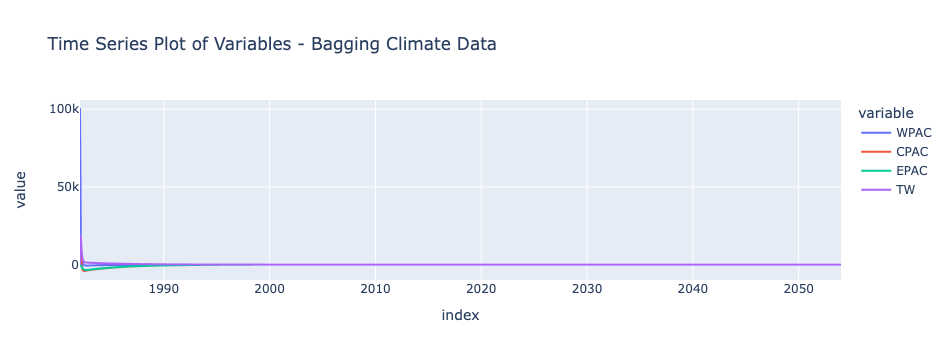

In [126]:
fig = px.line(df_bagging_climate, x=df_bagging_climate.index, y=df_bagging_climate.columns, title='Time Series Plot of Variables - Bagging Climate Data')
fig.show()

### Running bagging for this dataset

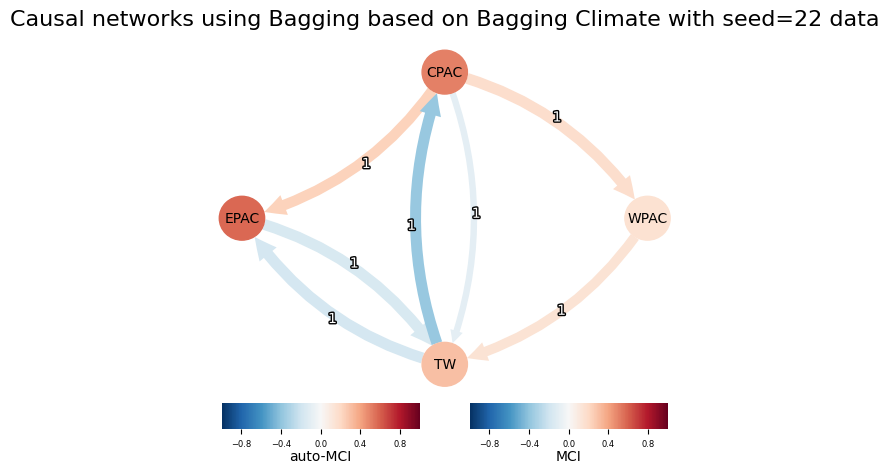

In [127]:
results_bagging_climate = Run_Bagging(df_bagging_climate, boot_samples=600, model=f'Bagging Climate with seed=22') # Dit kan ook veranderen met df_extended_data om de climate data te gebruiken

### Comparison statistic for this dataset

In [128]:
val_matrix_bagging_climate = results_bagging_climate['summary_results']['val_matrix_mean']

In [129]:
statistic_bagging_climate, check_bagging_climate = ComparisonStatistic(ci_matrix_bagging_climate, val_matrix_bagging_climate)

In [130]:
print(statistic_bagging_climate)

37.5


### Comparison statistic graph (automized)

In [131]:
def Run_and_Compare_BaggingOLD(mean_val_matrix, ci_matrix, initial_mean, initial_var, intervals=50, min_T=50, 
                            max_T=10000, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=200, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot_fig=True, print_loading=True, seed=None):
    """
    mean_val_matrix: the confidence intervals of the original DAG of the basemodel, needed for the construction of phi matrix 
    that will correspond to the baseline model
    ci_matrix: the confidence intervals of the original DAG of the basemodel, needed for comparning
    initial_means and initial_variances: needed for the construction of the dataset
    """
    l = (max_T - min_T)//intervals
    statistics = np.zeros((l,2))
    i = 0
    dfs = {}
    used_seeds = []
    for t in range(min_T, max_T, intervals):
        
        if seed == None:
            s = np.random.randint(1,20000)
            used_seeds.append(s)
            stat, _, dataframe, _, _, _, _, _, _ = MakeData_RunBagging_ComparisonStatistic(mean_val_matrix, ci_matrix, t, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=s, 
                        plot_data=False, yearly=yearly, freq=freq, column_names=column_names, 
                        tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_DAG=False, model='')
        else:
            stat, _, dataframe, _, _, _, _, _, _ = MakeData_RunBagging_ComparisonStatistic(mean_val_matrix, ci_matrix, t, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=seed, 
                        plot_data=False, yearly=yearly, freq=freq, column_names=column_names, 
                        tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_DAG=False, model='')
        
        # Now store the statistic for this particular run of t
        statistics[i,0] = t
        statistics[i,1] = stat
        
        dfs[f'dataframe_t_{t}'] = dataframe  # Save each dataframe in the dictionary

        if print_loading == True: 
            if i%20 ==0:
                print(f"loading... {np.round((i/l)*100)}%")
        
        i += 1  
    
    #Finally we store all results in a dataframe and print the corresponding figure
    df = pd.DataFrame(statistics, columns=['T','Statistic Value'])
    df.set_index('T', inplace=True)
    
    fig = px.line(df, x=df.index, y=df.columns, title='Correctness Statistic')
    fig.update_layout(yaxis_title='% within confidence bounds')
    fig.update_layout(xaxis_title='Number of time periods T in dataset')
    # Add the trend line to the plot
    x = df.index.values
    y = df['Statistic Value'].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    fig.add_trace(go.Scatter(x=x, y=p(x), mode='lines', name='Trend Line', line=dict(color='grey', dash='dash')))
    if plot_fig == True:
        fig.show()

    return statistics, df, fig, dfs, used_seeds

In [132]:
def Seed_Generator(l, lower_bound=1, upper_bound=100000):
    unique_seeds = set()
    while len(unique_seeds) < l:
        new_seed = np.random.randint(lower_bound, upper_bound)
        unique_seeds.add(new_seed)
    return list(unique_seeds)

In [140]:
def Run_and_Compare_Bagging(mean_val_matrix, ci_matrix, initial_mean, initial_var, intervals=50, min_T=50, 
                            max_T=10000, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=200, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, plot_fig=True, print_loading=True, seed=None):
    """
    mean_val_matrix: the confidence intervals of the original DAG of the basemodel, needed for the construction of phi matrix 
    that will correspond to the baseline model
    ci_matrix: the confidence intervals of the original DAG of the basemodel, needed for comparning
    initial_means and initial_variances: needed for the construction of the dataset
    """
    l = (max_T - min_T)//intervals
    statistics = np.zeros((l,2))
    i = 0
    dfs = {}
    
    if seed == None:
        unique_seeds = Seed_Generator(l)
    else:
        unique_seeds = [seed]*l
    
    for t in range(min_T, max_T, intervals):
        if seed == None:
            s = unique_seeds[i]
            stat, _, dataframe, _, _, _, _, _, _ = MakeData_RunBagging_ComparisonStatistic(mean_val_matrix, ci_matrix, t, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=s, 
                        plot_data=False, yearly=yearly, freq=freq, column_names=column_names, 
                        tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_DAG=False, model='')
        else:
            stat, _, dataframe, _, _, _, _, _, _ = MakeData_RunBagging_ComparisonStatistic(mean_val_matrix, ci_matrix, t, initial_mean, initial_var, constant_term=constant_term, standard_error_distribution=standard_error_distribution, seed=seed, 
                        plot_data=False, yearly=yearly, freq=freq, column_names=column_names, 
                        tau_max=tau_max, boot_samples=boot_samples, boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_DAG=False, model='')
        
        # Now store the statistic for this particular run of t
        statistics[i,0] = t
        statistics[i,1] = stat
        
        dfs[f'dataframe_t_{t}'] = dataframe  # Save each dataframe in the dictionary

        if print_loading == True: 
            if i%20 ==0:
                print(f"loading... {np.round(((i+1)/l)*100)}%")
        
        i += 1  
    
    #Finally we store all results in a dataframe and print the corresponding figure
    df = pd.DataFrame(statistics, columns=['T','Statistic Value'])
    df.set_index('T', inplace=True)
    
    fig = px.line(df, x=df.index, y=df.columns, title='Correctness Statistic')
    fig.update_layout(yaxis_title='% within confidence bounds')
    fig.update_layout(xaxis_title='Number of time periods T in dataset')
    # Add the trend line to the plot
    x = df.index.values
    y = df['Statistic Value'].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    fig.add_trace(go.Scatter(x=x, y=p(x), mode='lines', name='Trend Line', line=dict(color='grey', dash='dash')))
    if plot_fig == True:
        fig.show()

    return statistics, df, fig, dfs, unique_seeds

loading... 25.0%


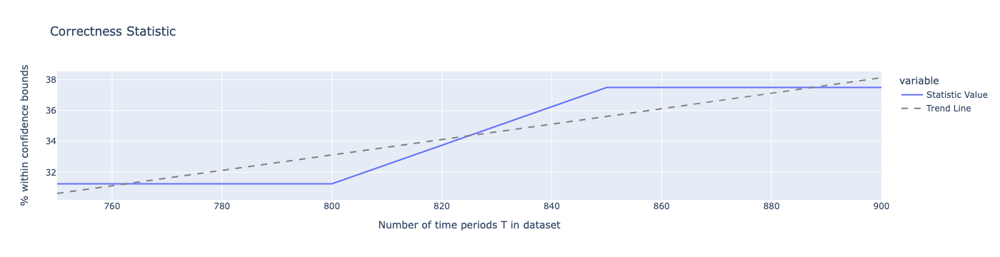

[37715, 62163, 51796, 15133]


In [138]:
statistics_CS_bagging_climate, df_CS_bagging_climate, fig_CS_bagging_climate, _, seeds3 = Run_and_Compare_Bagging(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, intervals=50, min_T=750, 
                            max_T=950, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=100, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=None)

print(seeds3)

loading... 25.0%


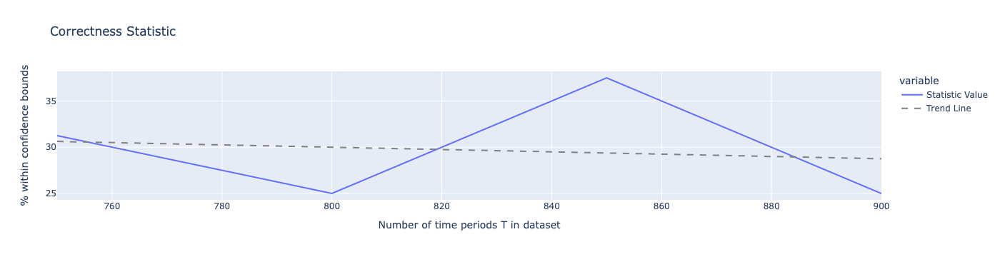

[37715, 37715, 37715, 37715]


In [141]:
statistics_CS_bagging_climate, df_CS_bagging_climate, fig_CS_bagging_climate, _, seeds3 = Run_and_Compare_Bagging(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, intervals=50, min_T=750, 
                            max_T=950, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=100, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=37715)

print(seeds3)

loading... 0.0%
loading... 71.0%


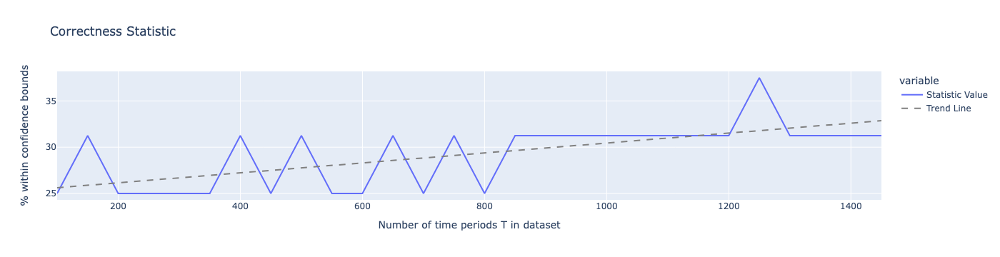

In [199]:
_, _, _, _ = Run_and_Compare_Bagging(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, intervals=50, min_T=100, 
                            max_T=1500, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=600, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=123)

loading... 0.0%
loading... 71.0%


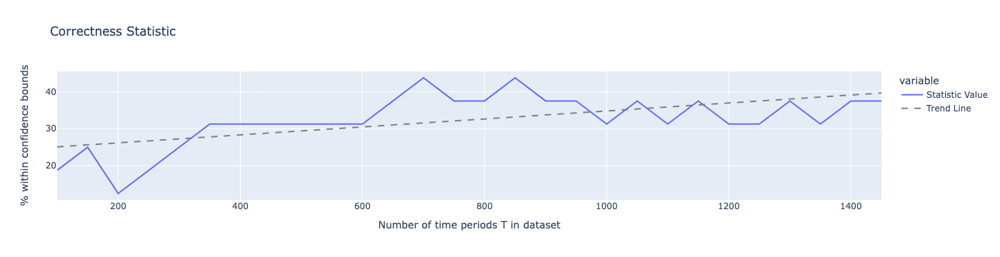

In [200]:
_, _, _, _ = Run_and_Compare_Bagging(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, intervals=50, min_T=100, 
                            max_T=1500, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=600, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=321)

In [201]:
_, _, _, _ = Run_and_Compare_Bagging(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, intervals=50, min_T=100, 
                            max_T=1500, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=600, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=666)

loading... 0.0%


KeyboardInterrupt: 

In [157]:
print(statistics_CS_bagging_climate.shape)

(28, 2)


### Monte Carlo CS graph

In [203]:
def MonteCarlo_CSgraph(mean_val_matrix, ci_matrix, initial_mean, initial_var, M, intervals=50, min_T=50, 
                            max_T=10000, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=200, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=None):
    """
    Now we run the formula for the CS graph multiple times and calculate the means for every output.
    Parameters:
    M: the number of monte carlo simulations to run
    """
    
    l = (max_T - min_T)//intervals
    
    MCstatistics = np.zeros((l, M+1)) 
    dataframes = {}
    
    for m in range(M):
        comp_stats, _, _, df_sim, seeds = Run_and_Compare_Bagging(mean_val_matrix, ci_matrix, initial_mean, initial_var, intervals=intervals, min_T=min_T, 
                            max_T=max_T, constant_term=constant_term, standard_error_distribution=standard_error_distribution, yearly=yearly, 
                            freq=freq, column_names=column_names, tau_max=tau_max, boot_samples=boot_samples, 
                            boot_blocklength=boot_blocklength, test=test, pc_alpha_bootstrap=pc_alpha_bootstrap, pc_alpha=pc_alpha, plot_fig=False, print_loading=False, seed=seed)
        MCstatistics[:,m+1] = comp_stats[:,1]
        dataframes[f'df_m_{m}'] = df_sim  # Save each dataframe in the dictionary
        print(f"loading... {np.round(((m+1)/M)*100)}%")
        #print(f"comp_stats for simulation {m}: {comp_stats[:, 1]}")

    # And use the last iteration of the statistics to save indeces in the first column of MCstatistics
    MCstatistics[:,0] = comp_stats[:,0]
    
    # Now we will calculate the mean values and store that in a matrix as well
    means = np.mean(MCstatistics[:, 1:], axis=1)
    mean_values = np.zeros((l,2))
    mean_values[:,0] = MCstatistics[:,0]
    mean_values[:,1] = means
    
    # For convenience, we store the values in a dataframe
    #df = pd.DataFrame(MCstatistics, columns=['T','Statistic Value'])
    #df.set_index('T', inplace=True)
    
    # Finally we plot the figure
    fig = go.Figure()
    colors = px.colors.sequential.Blues
    # Plot lines for each column in MCstatistics (except for the first, which has the indeces)
    for i in range(1, M+1):
        fig.add_trace(go.Scatter(x=MCstatistics[:, 0], y=MCstatistics[:, i],
                             mode='lines', line=dict(color=colors[i % len(colors)]),
                             name=f'Sim {i}'))
        
    # Plot the mean value line, which will be our MC statistic
    fig.add_trace(go.Scatter(x=mean_values[:, 0], y=mean_values[:, 1],
                         mode='lines', 
                         line=dict(color='red'),
                         name='MC statistic'))
    # Calculate and plot the trend line
    z = np.polyfit(mean_values[:, 0], mean_values[:, 1], 1)
    p = np.poly1d(z)
    fig.add_trace(go.Scatter(x=mean_values[:, 0], y=p(mean_values[:, 0]),
                         mode='lines', 
                         line=dict(color='grey', dash='dash'),
                         name='Trend Line'))
    # Finish up and plot the graph
    fig.update_layout(title='Monte Carlo Simulations for Comparison Statistic',
                  xaxis_title='Number of time periods T in dataset',
                  yaxis_title='% within confidence bounds')
    fig.show()
    
    return MCstatistics, fig, dataframes, seeds

loading... 25.0%
loading... 50.0%
loading... 75.0%
loading... 100.0%


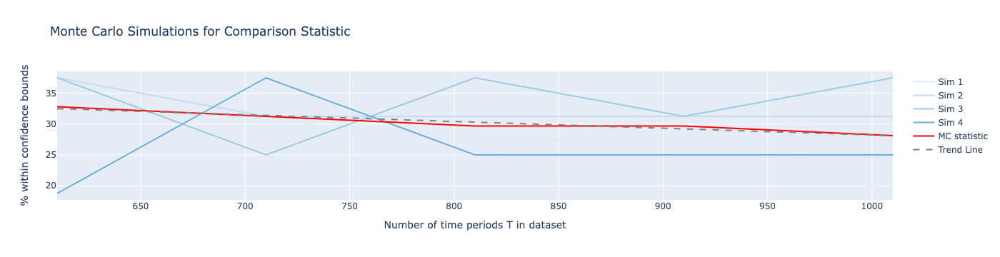

In [209]:
MCstatistics_bagging_climate, MCfig_bagging_climate, MCdfs_bagging_climate, MCseeds_bagging_climate = MonteCarlo_CSgraph(val_matrix_bagging_climate, ci_matrix_bagging_climate, means, variances, 4, intervals=100, min_T=610, 
                            max_T=1110, constant_term=False, standard_error_distribution=True, yearly=False, 
                            freq='ME', column_names=['WPAC','CPAC','EPAC','TW'], tau_max=1, boot_samples=200, 
                            boot_blocklength=1, test=ParCorr(), pc_alpha_bootstrap=0.05, pc_alpha=None, seed=None)

In [211]:
# MORGEN: TILLIE: deze runnen maar weer met boot_samples = 600 en groter  (en een line toevoegen dat seeds niet herhaald mogen worden)
# Ook kijken naar dit in 1 functietje zetten waarbij de seeds wat mooier zijn miss.
# En dezelfde MC voor ook de PCMCI doen (dat runt ook sneller dan bagging)
# Daarna pas door met kijken hoeveel van de dataset verloren is gegaan (want dat zeg wat over deze outcomes)

In [210]:
print(MCseeds_bagging_climate)

[16439, 14397, 16209, 10984, 15484]


{'df_m_0': {'dataframe_t_700':                     WPAC         CPAC         EPAC            TW
1982-01-31  98505.445113   298.033748   299.380017      4.564650
1982-02-28  17156.815310  7216.757951  -114.057804  18032.617331
1982-03-31   4726.797237  -523.453521 -1406.395832   7922.134124
1982-04-30   1112.500913 -3280.420643 -2376.762851   3608.468995
1982-05-31    -79.770600 -3985.997186 -2949.937610   2070.786917
...                  ...          ...          ...           ...
2039-12-31      0.820682     4.546385     4.088341      0.110610
2040-01-31      0.957256     4.504881     1.551038     -1.825399
2040-02-29     -0.532213     3.790343     2.171589     -0.411059
2040-03-31     -0.376847     1.471107     1.680528      0.110050
2040-04-30     -0.072870     1.746021     0.816154     -0.956037

[700 rows x 4 columns], 'dataframe_t_800':                     WPAC         CPAC         EPAC            TW
1982-01-31  99178.943341   298.335230   294.705363      5.002699
1982-02-28  172

## Automization

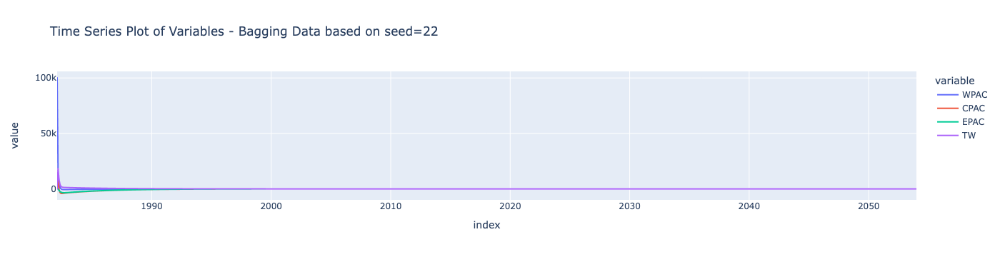

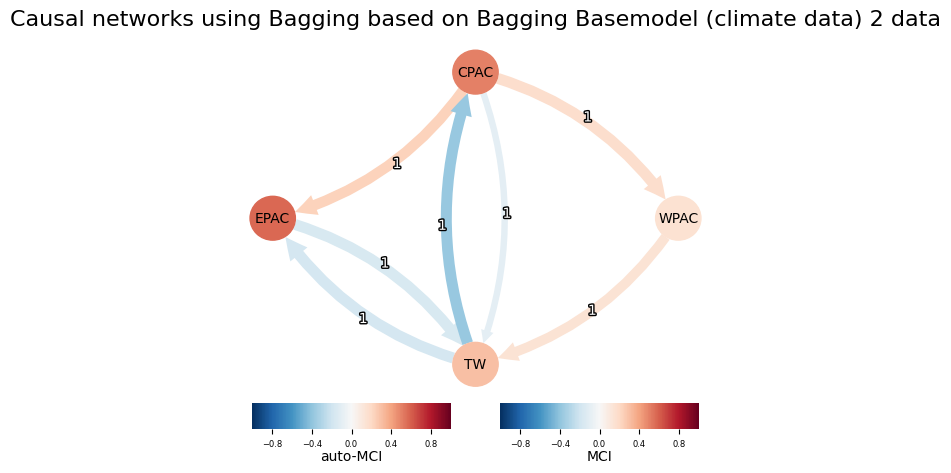

In [128]:
results_bagging_climate_2, _, _, _, _, _, _ = MakeData_RunBagging(value_matrix_bagging_climate, 864, means, variances, seed=22, plot_data=True,  boot_samples=600, model='Bagging Basemodel (climate data) 2')
    

31.25


# Alternative Dataset

We will now create an alternative phi matrix, make a dataset with this, run PCMCI on this and use these outputs to create a test-phi again and the corresponding ci_matrix. Then we can run the PCMCI again on datasets generated by the test-phi and check how well PCMCI can then stay within the confidence bounds.

## Define a new Target Dataset

In [ ]:
alternative_Phi = np.zeros((4,4))

In [116]:
print(extended_data.shape)

(864, 4)
